# Trabalho de Implementação

## INF2912 - Otimização Combinatória
### Prof. Marcus Vinicius Soledade Poggi de Aragão
### 2015-2

### Ciro Cavani
#### BigData / Globo.com

Algoritmos de clusterização.

## Conteúdo

Esse notebook tem as seguintes seções:

1. [Generator](#1.-Generator)

    Algoritmo para gerar _dataset_ baseado no código Python feito pelo Poggi.
    
    Na descrição do trabalho está definido como o _dataset_ é formado. Cada grupo tem um conjunto de _features_ próprias com uma probabilidade de ativação maior do que as _features_ livres.
    <br/><br/>

2. [Visualização](#2.-Visualization)

    Formas de apresentar o _dataset_ na forma de gráfico bidimensional.
    
    Foram testadas três algoritmos: norma das partes superior e inferior do vetor de _features_ (recomendado em aula); norma das _features do grupo_ contra as _features_ livres, e; Principal Component Analysis (PCA) para redução de dimensões.
    
    Os dois primeiros não apresentam muita diferenciação entre os pontos dos grupos. O PCA funciona bem (boa separação) com 3 ou 4 grupos, mas fica com sobreposição para 5+.
    <br/><br/>

3. [Avaliação](#3.-Evaluation)

    Métricas para avaliação de algoritmos de clusterização.
    
    É implementado um algoritmo de clusterização aleatório ponderado. A partir desse algoritmo, é calculada a matriz de confusão, Accuracy, Precision, Recall e etc.
    <br/><br/>

4. [Exportação](#4.-Export-/-Load)

    Geração de datasets a serem usados para o desenvolvimento dos algoritmos desse trabalho.

## 1. Generator

Problema:

Propor um classificador que identifique o grupo de cada objeto.

Dados:

* $g$: número de grupos diferentes
* $n$: número de objetos (não necessariamente diferentes)
* $n_{min}$: número mínimo de objetos em um grupo
* $n_{max}$: número máximo de objetos em um grupo

Para cada Objeto:

* $c$: número de características binárias
* $c_y$: número de características de um determinado grupo
* $c_n$: número de características dos demais grupos ($c_n = c_y (g - 1)$)
* $p$: probabilidade de ativação das características de um grupo ($p > 0.5$)
* $1 - p$: probabilidade de ativação das características dos demais grupos
* $p' = 0.5$: probabilidade de ativação das características que não são de qualquer grupo
* (as características de cada grupo não tem interseção)

In [1]:
"gera a distribuição de objetos para os grupos"
function group_size(g, n, n_min, n_max)
    num_g = Array(Int, g)
    sum = 0
    for i=1:g
        num_g[i] = rand(n_min:n_max)
        sum += num_g[i]
    end
    correct = n / sum
    sum = 0
    for i=1:g
        num_g[i] = round(Int, num_g[i] * correct)
        sum += num_g[i]
    end
    if sum < n
        num_g[g] += 1
    end
    num_g
end

group_size (generic function with 1 method)

In [2]:
let n = 20,
    n_min = 2,
    n_max = 5,
    g = 5
    
    group_size(g, n, n_min, n_max)
end

5-element Array{Int64,1}:
 5
 4
 4
 4
 3

In [3]:
"máscara de características para cada grupo sem interseção"
function group_mask(g, c, c_y)
    char_g = fill(-1, c)
    index = 1
    for i=1:g, j=1:c_y
        char_g[index] = i
        index += 1
    end
    char_g
end

group_mask (generic function with 1 method)

In [4]:
let g = 5,
    c = 16,
    c_y = 3
    
    group_mask(g, c, c_y)
end

16-element Array{Int64,1}:
  1
  1
  1
  2
  2
  2
  3
  3
  3
  4
  4
  4
  5
  5
  5
 -1

In [5]:
"""gera objetos para grupos seguindo a distribuição num_g,
a máscara char_g e a probabilidade p de ativação"""
function generate_data(num_g, char_g, p)
    data = Array(Tuple{Array{Int,1},Int}, 0)
    for i=1:length(num_g),j=1:num_g[i]
        vect = zeros(Int, length(char_g))
        for k=1:length(vect)
            if char_g[k] == i
                vect[k] = rand() < p ? 1 : 0
            elseif char_g[k] != -1
                vect[k] = rand() < 1 - p ? 1 : 0
            else
                vect[k] = rand() < 0.5 ? 1 : 0
            end
        end
        push!(data, (vect, i))
    end
    data
end

generate_data (generic function with 1 method)

In [6]:
"gerador de instâncias para o problema de clusterização"
function instance_generator(n, c, c_y, p, g, n_min, n_max)
    if c < g * c_y
        error("c_y too big")
    end
    
    num_g = group_size(g, n, n_min, n_max)
    char_g = group_mask(g, c, c_y)
    data = generate_data(num_g, char_g, p)
    data
end

instance_generator (generic function with 1 method)

In [7]:
let n = 20,
    n_min = 2,
    n_max = 5,
    g = 5,
    c = 16,
    c_y = 3,
    p = 0.8
    
    instance_generator(n, c, c_y, p, g, n_min, n_max)
end

21-element Array{Tuple{Array{Int64,1},Int64},1}:
 ([0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0],1)
 ([1,1,1,1,0,1,1,0,0,0,0,0,0,0,0,1],1)
 ([1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1],1)
 ([0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,1],2)
 ([0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1],2)
 ([0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,1],2)
 ([0,0,0,1,1,1,0,0,0,1,0,1,0,0,1,0],2)
 ([0,0,0,1,1,1,1,0,0,0,1,0,0,0,1,1],2)
 ([1,0,0,1,1,1,1,0,0,1,0,0,0,0,0,0],2)
 ([0,0,0,1,1,1,1,0,1,1,1,0,0,0,0,1],2)
 ([0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0],3)
 ([0,0,1,0,1,0,1,1,1,0,0,0,1,0,0,0],3)
 ([0,0,1,0,0,0,1,1,1,0,0,1,0,1,0,1],3)
 ([0,0,1,0,0,0,1,1,1,0,1,0,0,0,0,1],3)
 ([0,0,0,1,0,0,0,1,1,1,0,1,1,0,0,1],3)
 ([0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1],4)
 ([0,1,1,0,0,0,0,0,1,1,1,0,1,0,0,1],4)
 ([0,0,0,0,1,0,0,0,0,1,1,1,0,0,0,0],4)
 ([0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0],5)
 ([0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1],5)
 ([0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0],5)

In [8]:
type Dataset
    groups::Int
    features::Int
    slot::Int
    activation_p::Float64
    size::Int
    size_min::Int
    size_max::Int
    data::Array{Tuple{Array{Int,1}, Int}, 1}
    
    Dataset(; groups=3, size=10000, size_min=0, size_max=0, features=200, slot=40, activation_p=0.8) = begin
        if size < 10
            error("minimum 10")
        end
        if groups > size
            error("too many groups")
        end
        if features < groups * slot
            error("slot too big")
        end
    
        if size_max == 0
            size_max = 2 * round(Int, size / groups)
        end
        if size_min == 0
            size_min = round(Int, size_max / 10)
        end
        if size_max * groups < size
            error("size_max too tight")
        end
    
        data = instance_generator(size, features, slot, activation_p, groups, size_min, size_max)
        shuffle!(data)
        
        new(groups, features, slot, activation_p, size, size_min, size_max, data)
    end
end

data(ds, k) = filter(t -> t[2] == k, ds.data)
count(ds, k) = length(data(ds, k))

"Sumário do Dataset"
function summary(io::IO, ds::Dataset)
    println(io, "Number of Groups: ", ds.groups)
    println(io, "Number of Features: ", ds.features)
    println(io, "Number of Features (group): ", ds.slot)
    println(io, "Probability of Activation: ", ds.activation_p)
    println(io, "Number of Objects (total): ", ds.size)
    println(io, "Number of Objects per Group (min): ", ds.size_min)
    println(io, "Number of Objects per Group (max): ", ds.size_max)

    for k=1:ds.groups
        println(io, "Number of Objects in ", k, ": ", count(ds, k))
    end
end

"Sumário do Dataset"
summary(ds::Dataset) = summary(STDOUT, ds)
    
let _dataset = Dataset()
    summary(_dataset)
    sleep(0.2)
end

Number of Groups: 3
Number of Features: 200
Number of Features (group): 40
Probability of Activation: 0.8
Number of Objects (total): 10000
Number of Objects per Group (min): 667
Number of Objects per Group (max): 6666
Number of Objects in 1: 3323
Number of Objects in 2: 2618
Number of Objects in 3: 4059


## 2. Visualization

### Gadfly

http://gadflyjl.org/

Gadfly is a system for plotting and visualization based largely on Hadley Wickhams's ggplot2 for R, and Leland Wilkinson's book The Grammar of Graphics.

In [9]:
if Pkg.installed("Gadfly") === nothing
    println("Installing Gadfly...")
    Pkg.add("Gadfly")
    Pkg.add("Cairo")
end

In [10]:
using Gadfly
set_default_plot_size(24cm, 12cm)

In [11]:
dataset = Dataset()

Dataset(3,200,40,0.8,10000,667,6666,[([1,1,1,1,1,1,1,1,1,0  …  0,1,1,0,0,0,1,1,0,0],1),([1,1,1,1,0,1,0,1,1,0  …  0,1,1,1,1,0,0,1,1,0],1),([0,1,1,1,1,1,1,0,1,1  …  0,1,1,1,0,1,1,0,0,0],1),([0,0,0,1,0,0,0,0,1,0  …  1,1,0,1,0,0,1,0,1,0],2),([0,0,0,0,0,0,0,1,0,0  …  0,1,1,1,1,0,1,1,0,0],3),([0,0,0,0,0,0,0,1,0,0  …  1,0,1,1,1,1,0,0,0,1],3),([0,0,0,0,0,0,0,0,0,1  …  1,1,1,1,1,0,1,1,1,0],2),([0,0,0,0,0,0,0,0,1,0  …  0,1,0,0,1,0,0,0,1,1],2),([0,0,1,1,0,0,0,1,0,1  …  1,1,1,1,1,1,0,0,1,0],2),([0,0,0,0,0,0,0,0,0,0  …  1,1,1,0,1,0,0,1,1,1],2)  …  ([0,1,0,0,1,1,1,1,1,1  …  0,1,1,0,1,1,1,1,1,1],1),([1,0,1,0,1,1,0,1,1,1  …  1,0,1,1,1,1,0,1,1,0],1),([0,1,1,0,0,1,1,1,0,1  …  1,0,1,0,1,1,0,0,0,1],1),([0,0,0,0,0,0,1,0,0,1  …  0,1,1,1,1,1,0,0,1,1],2),([1,0,1,0,0,0,1,0,0,0  …  1,0,0,1,1,1,1,1,0,0],2),([1,0,0,0,0,1,1,0,0,0  …  1,1,1,1,0,1,1,1,0,1],3),([1,1,1,1,1,1,0,1,1,1  …  1,0,0,0,0,1,1,0,1,0],1),([1,1,1,1,0,1,0,1,0,1  …  0,1,0,1,0,1,0,0,1,0],1),([0,0,0,0,1,0,0,1,0,0  …  0,1,1,1,0,1,0,0,0,0],2),([0,0,0,1

In [12]:
function halfmask(n)
    mask = zeros(n)
    middle = round(Int, n / 2)
    mask[1:middle] = 1
    mask
end

halfmask(10)

10-element Array{Float64,1}:
 1.0
 1.0
 1.0
 1.0
 1.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [13]:
reversemask(mask) = ones(mask) - mask

let mask = halfmask(10)
    reversemask(mask)
end

10-element Array{Float64,1}:
 0.0
 0.0
 0.0
 0.0
 0.0
 1.0
 1.0
 1.0
 1.0
 1.0

In [14]:
function halfmasks(n)
    x = halfmask(n)
    y = reversemask(x)
    (x, y)
end

let a = rand(10),
    masks = halfmasks(10)
    (masks[1] .* a, masks[2] .* a)
end

([0.4375007383708953,0.7985065523282371,0.3437691881529654,0.1584180792155101,0.500347432862366,0.0,0.0,0.0,0.0,0.0],[0.0,0.0,0.0,0.0,0.0,0.8191685977987728,0.6436413300950601,0.5731673274183051,0.7700931689131907,0.18817540000764965])

In [15]:
function reduce2d(data, masks)
    x = map(t -> norm(masks[1] .* t[1]), data)
    y = map(t -> norm(masks[2] .* t[1]), data)
    k = map(t -> string(t[2]), data)
    x, y, k
end

function plothalf(dataset)
    masks = halfmasks(dataset.features)

    g = Array(Layer, 0)
    
    for k=1:dataset.groups
        kdata = data(dataset, k)
        x, y, color = reduce2d(kdata, masks)
        push!(g, layer(x=x, y=y, color=color, Geom.point)...)
    end
    
    plot(g, Scale.x_continuous(minvalue=0, maxvalue=10), Scale.y_continuous(minvalue=0, maxvalue=10))
end

plothalf (generic function with 1 method)

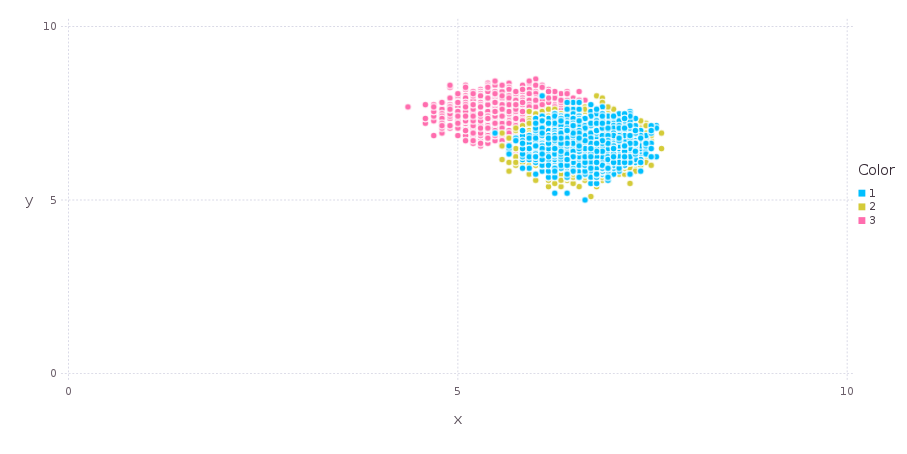

In [16]:
plothalf(dataset)

In [17]:
function plothalf_multi(dataset)
    masks = halfmasks(dataset.features)
    
    g = Array(Plot, 0)
    
    for k=1:dataset.groups
        kdata = data(dataset, k)
        x, y, _ = reduce2d(kdata, masks)
        p = plot(x=x, y=y, Scale.x_continuous(minvalue=0, maxvalue=10), Scale.y_continuous(minvalue=0, maxvalue=10))
        push!(g, p)

    end
    
    hstack(g...)
end

plothalf_multi (generic function with 1 method)

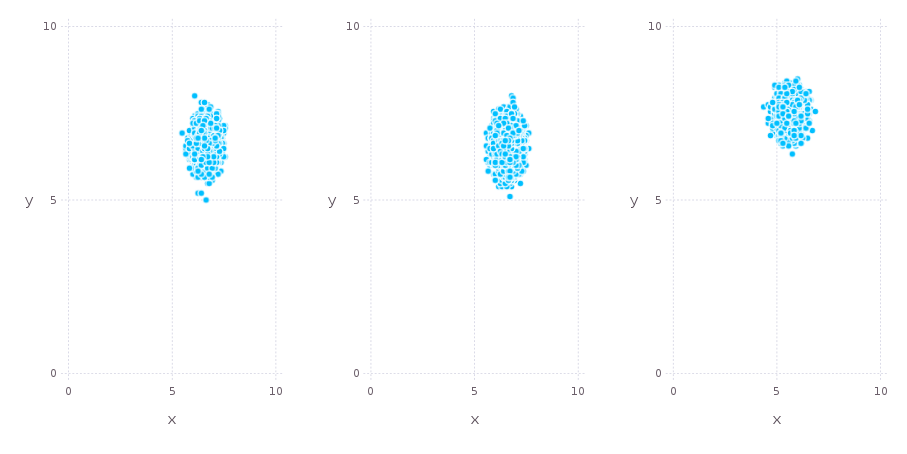

In [18]:
plothalf_multi(dataset)

In [19]:
function featuremask(features, slot, k)
    first = (k - 1) * slot + 1
    last = k * slot
    mask = zeros(features)
    mask[first:last] = 1
    mask
end

featuremask(10, 3, 1)

10-element Array{Float64,1}:
 1.0
 1.0
 1.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [20]:
function featuremasks(features, slot, k)
    kmask = featuremask(features, slot, k)
    rmask = reversemask(kmask)
    (kmask, rmask)
end

let a = rand(10),
    masks = featuremasks(10, 3, 2)
    (masks[1] .* a, masks[2] .* a)
end

([0.0,0.0,0.0,0.45834517910600336,0.04416253139337978,0.6353298478811882,0.0,0.0,0.0,0.0],[0.06045974263424392,0.5732089655062735,0.3084730390259127,0.0,0.0,0.0,0.6167535144041767,0.4010862311527357,0.22761542392052014,0.670323015210684])

In [21]:
function plotslot(dataset)
    g = Array(Layer, 0)
    
    for k=1:dataset.groups
        masks = featuremasks(dataset.features, dataset.slot, k)
        kdata = data(dataset, k)
        x, y, color = reduce2d(kdata, masks)
        push!(g, layer(x=x, y=y, color=color, Geom.point)...)
    end
    
    plot(g, Scale.x_continuous(minvalue=0, maxvalue=10), Scale.y_continuous(minvalue=0, maxvalue=10))
end

plotslot (generic function with 1 method)

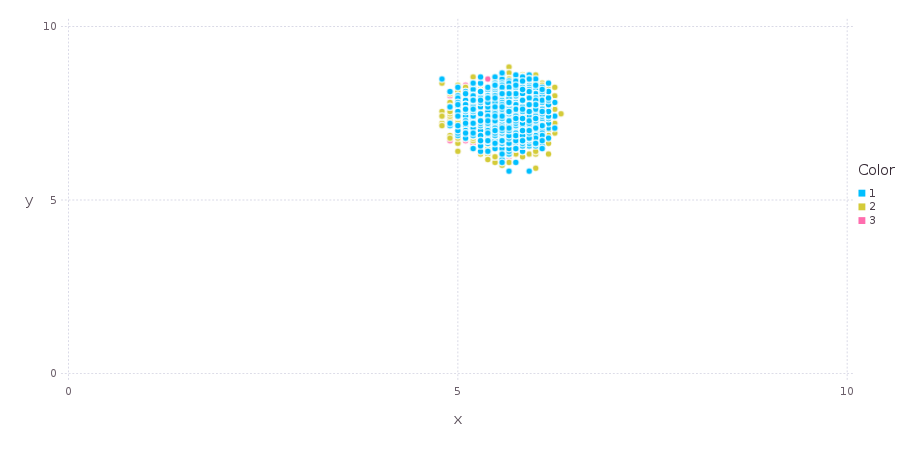

In [22]:
plotslot(dataset)

In [23]:
function plotslot_multi(dataset)
    g = Array(Plot, 0)
    
    for k=1:dataset.groups
        masks = featuremasks(dataset.features, dataset.slot, k)
        kdata = data(dataset, k)
        x, y, _ = reduce2d(kdata, masks)
        p = plot(x=x, y=y, Scale.x_continuous(minvalue=0, maxvalue=10), Scale.y_continuous(minvalue=0, maxvalue=10))
        push!(g, p)
    end
    
    hstack(g...)
end

plotslot_multi (generic function with 1 method)

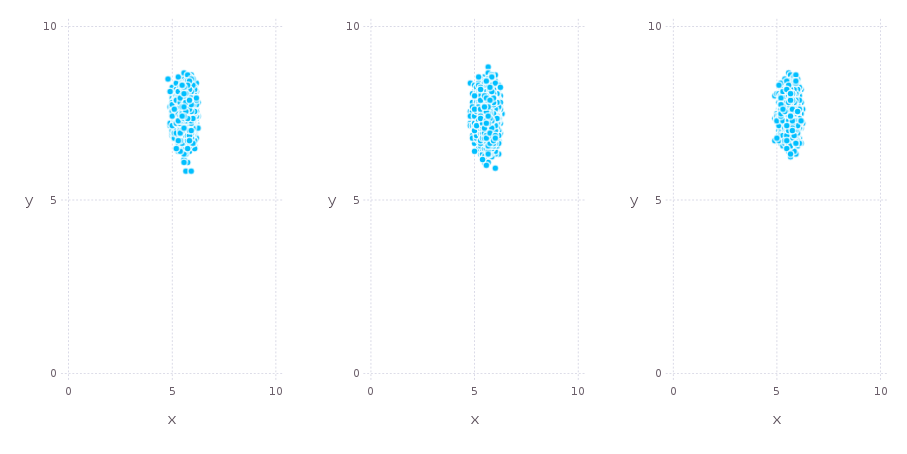

In [24]:
plotslot_multi(dataset)

### MultivariateStats Package

https://github.com/JuliaStats/MultivariateStats.jl

http://multivariatestatsjl.readthedocs.org/en/latest/index.html

A Julia package for multivariate statistics and data analysis (e.g. dimension reduction)

#### Principal Component Analysis (PCA)

http://multivariatestatsjl.readthedocs.org/en/latest/pca.html

In [25]:
if Pkg.installed("MultivariateStats") === nothing
    println("Installing MultivariateStats...")
    Pkg.add("MultivariateStats")
    Pkg.checkout("MultivariateStats")
end

In [26]:
matrix(data) = float(hcat(map(first, data)...))

matrix([([1,2], 1), ([3,4], 2), ([5,6], 3)])

2x3 Array{Float64,2}:
 1.0  3.0  5.0
 2.0  4.0  6.0

In [27]:
using MultivariateStats

In [28]:
let train = matrix(dataset.data)
    fit(PCA, train; maxoutdim=2)
end

PCA(indim = 200, outdim = 2, principalratio = 0.19494)

In [29]:
let train = matrix(dataset.data),
    model = fit(PCA, train; maxoutdim=2)
    
    sample = data(dataset, 1)
    transform(model, matrix(sample))
end

2x3157 Array{Float64,2}:
 2.90348  2.52256  2.80591   2.98064  …  3.09083  3.34821  2.74889  2.64308
 1.50803  1.64484  0.698902  1.6003      1.09301  2.07549  1.66346  1.70987

In [30]:
let train = matrix(dataset.data),
    model = fit(PCA, train; maxoutdim=2)
    
    sample = data(dataset, 1)
    points = transform(model, matrix(sample))
    vec(points[1,:])
end

3157-element Array{Float64,1}:
 2.90348
 2.52256
 2.80591
 2.98064
 3.23991
 2.7537 
 2.86279
 2.84578
 3.57327
 1.34105
 2.49099
 3.12914
 2.18843
 ⋮      
 2.75908
 2.08887
 2.36002
 3.00488
 2.8451 
 2.93136
 2.48775
 2.74521
 3.09083
 3.34821
 2.74889
 2.64308

In [31]:
function plotpca(dataset)
    train = matrix(dataset.data)
    model = fit(PCA, train; maxoutdim=2)
    
    g = Array(Layer, 0)
    
    for k=1:dataset.groups
        kdata = data(dataset, k)
        kpoints = transform(model, matrix(kdata))
        x = vec(kpoints[1,:])
        y = vec(kpoints[2,:])
        color = fill(string(k), size(kpoints, 2))
        push!(g, layer(x=x, y=y, color=color, Geom.point)...)
    end
    
    plot(g)
end

plotpca (generic function with 1 method)

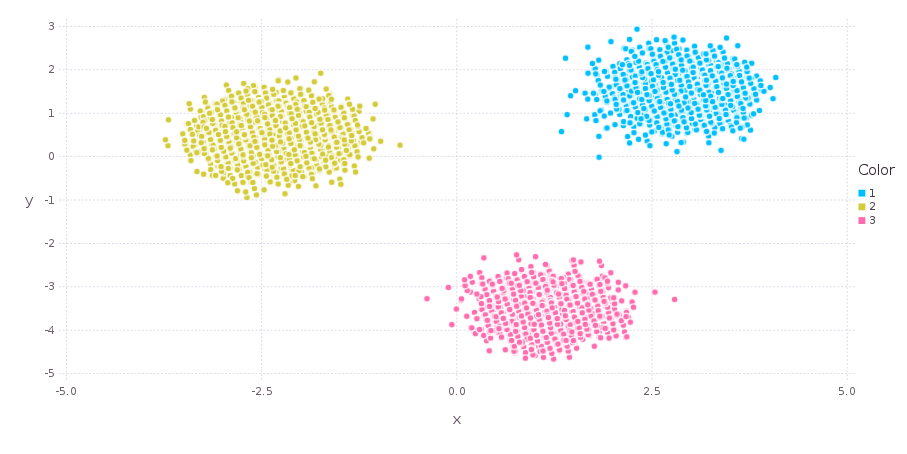

In [32]:
plotpca(dataset)

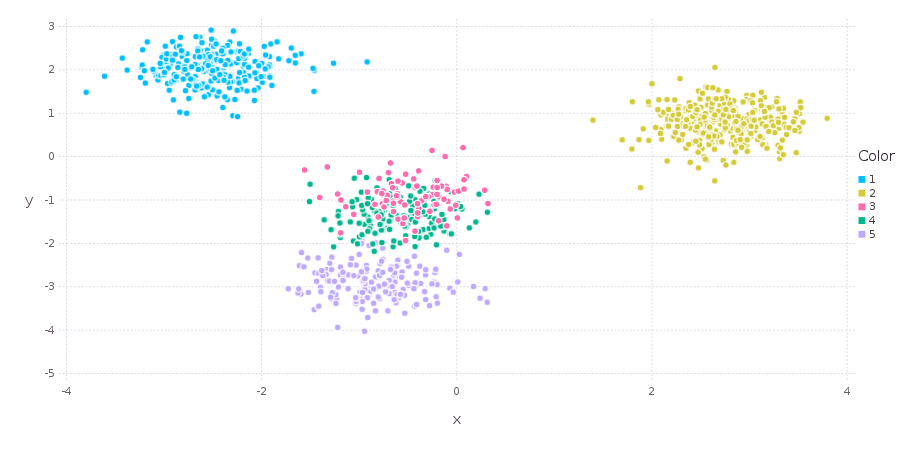

In [33]:
let _dataset = Dataset(groups=5, size=1000, features=200, slot=40)
    plotpca(_dataset)
end

## 3. Evaluation

In [34]:
function distribution(dataset)
    groups = Array(Float64, dataset.groups)
    size = 0
    for k=1:dataset.groups
        size += count(dataset, k)
        groups[k] = size
    end
    groups /= size
    groups
end

distribution(dataset)

3-element Array{Float64,1}:
 0.3157
 0.798 
 1.0   

In [35]:
function choosek(distribution)
    r = rand()
    for k=1:length(distribution)
        if r <= distribution[k]
            return k
        end
    end
    return 0
end

let
    d = [0.3, 0.5, 1.0]
    k = zeros(d)
    n = 100000
    for _=1:n
        i = choosek(d)
        k[i] += 1
    end
    k / n
end

3-element Array{Float64,1}:
 0.29959
 0.20094
 0.49947

In [36]:
function random_clustering(dataset)
    cdf = distribution(dataset)
    clusters = Array(Int, length(dataset.data))
    for i=1:length(clusters)
        clusters[i] = choosek(cdf)
    end
    clusters
end

random_clustering(dataset)

10000-element Array{Int64,1}:
 3
 2
 1
 2
 1
 1
 2
 2
 1
 2
 2
 1
 3
 ⋮
 2
 1
 1
 3
 1
 3
 1
 2
 3
 1
 1
 1

### Confusion Matrix

https://en.wikipedia.org/wiki/Confusion_matrix

In [37]:
function evaluate(dataset, prediction)
    matrix = zeros(Int, dataset.groups, dataset.groups)
    for p=1:length(prediction)
        i = dataset.data[p][2]
        j = prediction[p]
        matrix[i,j] += 1
    end
    matrix
end

let
    prediction = random_clustering(dataset)
    evaluate(dataset, prediction)
end

3x3 Array{Int64,2}:
  983  1567  607
 1474  2383  966
  646   950  424

In [38]:
evaluate(dataset, map(t -> t[2], dataset.data))

3x3 Array{Int64,2}:
 3157     0     0
    0  4823     0
    0     0  2020

In [39]:
function evaluation_summary(io::IO, dataset, prediction)
    matrix = evaluate(dataset, prediction)

    n = sum(matrix)
    tp = sum(diag(matrix))
    fn = sum(triu(matrix)) - tp
    fp = sum(tril(matrix)) - tp
    
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    fscore = 2 * precision * recall / (precision + recall)
    
    println(io, "Precision: ", round(100 * precision, 2), "%")
    println(io, "Recall: ", round(100 * recall, 2), "%")
    println(io, "F-score: ", round(fscore , 2))
    println(io)
    println(io, "Número de predições: ", n)
    println(io, "Acertos: ", tp, " (", round(100 * tp / n, 2), "%)")
    println(io, "Falso negativo: ", fn, " (", round(100 * fn / n, 2), "%)")
    println(io, "Falso positivo: ", fp, " (", round(100 * fp / n, 2), "%)")

    for k=1:dataset.groups
        kn = sum(matrix[k,:])
        ktp = matrix[k,k]
        kfn = kn - ktp
        kfp = sum(matrix[:,k]) - ktp
        ktn = n - kfn - kfp - ktp
        kacc = (ktp + ktn) / n
        kprecision = ktp / (ktp + kfp)
        krecall = ktp / (ktp + kfn)
        kfscore = 2 * kprecision * krecall / (kprecision + krecall)
        println(io)
        println(io, "Cluster ", k)
        println(io)
        println(io, "Objetos: ", kn)
        println(io, "Accuracy: ", round(100 * kacc, 2), "%")
        println(io, "Precision: ", round(100 * kprecision, 2), "%")
        println(io, "Recall: ", round(100 * krecall, 2), "%")
        println(io, "F-score: ", round(kfscore , 2))
        println(io)
        println(io, "Acerto positivo: ", ktp, " (", round(100 * ktp / kn, 2), "%)")
        println(io, "Acerto negativo: ", ktn, " (", round(100 * ktn / (n - kn), 2), "%)")
        println(io, "Falso negativo: ", kfn, " (", round(100 * kfn / fn, 2), "%)")
        println(io, "Falso positivo: ", kfp, " (", round(100 * kfp / fp, 2), "%)")
    end
end

evaluation_summary(dataset, prediction) = evaluation_summary(STDOUT, dataset, prediction)

let
    prediction = random_clustering(dataset)
    evaluation_summary(dataset, prediction)
    sleep(0.2)
end

Precision: 53.98%
Recall: 54.24%
F-score: 0.54

Número de predições: 10000
Acertos: 3709 (37.09%)
Falso negativo: 3129 (31.29%)
Falso positivo: 3162 (31.62%)

Cluster 1

Objetos: 3157
Accuracy: 56.63%
Precision: 31.57%
Recall: 32.02%
F-score: 0.32

Acerto positivo: 1011 (32.02%)
Acerto negativo: 4652 (67.98%)
Falso negativo: 2146 (68.58%)
Falso positivo: 2191 (69.29%)

Cluster 2

Objetos: 4823
Accuracy: 49.89%
Precision: 48.04%
Recall: 47.69%
F-score: 0.48

Acerto positivo: 2300 (47.69%)
Acerto negativo: 2689 (51.94%)
Falso negativo: 2523 (80.63%)
Falso positivo: 2488 (78.68%)

Cluster 3

Objetos: 2020
Accuracy: 67.66%
Precision: 19.8%
Recall: 19.7%
F-score: 0.2

Acerto positivo: 398 (19.7%)
Acerto negativo: 6368 (79.8%)
Falso negativo: 1622 (51.84%)
Falso positivo: 1612 (50.98%)


In [40]:
evaluation_summary(dataset, map(t -> t[2], dataset.data))
sleep(0.2)

Precision: 100.0%
Recall: 100.0%
F-score: 1.0

Número de predições: 10000
Acertos: 10000 (100.0%)
Falso negativo: 0 (0.0%)
Falso positivo: 0 (0.0%)

Cluster 1

Objetos: 3157
Accuracy: 100.0%
Precision: 100.0%
Recall: 100.0%
F-score: 1.0

Acerto positivo: 3157 (100.0%)
Acerto negativo: 6843 (100.0%)
Falso negativo: 0 (NaN%)
Falso positivo: 0 (NaN%)

Cluster 2

Objetos: 4823
Accuracy: 100.0%
Precision: 100.0%
Recall: 100.0%
F-score: 1.0

Acerto positivo: 4823 (100.0%)
Acerto negativo: 5177 (100.0%)
Falso negativo: 0 (NaN%)
Falso positivo: 0 (NaN%)

Cluster 3

Objetos: 2020
Accuracy: 100.0%
Precision: 100.0%
Recall: 100.0%
F-score: 1.0

Acerto positivo: 2020 (100.0%)
Acerto negativo: 7980 (100.0%)
Falso negativo: 0 (NaN%)
Falso positivo: 0 (NaN%)


In [41]:
let
    n = 100
    k = 3
    c = 16
    c_y = 3

    tiny = Dataset(size=n, groups=k, features=c, slot=c_y)
    summary(tiny)

    assignments = map(t -> rand() <= 0.7 ? k - t[2] + 1 : rand(1:k), tiny.data)

    centermap = zeros(Int, k)
    groups = map(v -> v[2], tiny.data)
    for i=1:k
        g_index = findin(groups, i)
        centers = map(i -> assignments[i], g_index)
        counts = hist(centers, 0:k)[2]
        center_key = indmax(counts)
        if centermap[center_key] != 0
            error("Center already mapped: $(center_key) -> $(centermap[center_key]), now $i?")
        end
        centermap[center_key] = i
    end
    println(collect(enumerate(centermap)))
    sleep(0.2)
end

Number of Groups: 3
Number of Features: 16
Number of Features (group): 3
Probability of Activation: 0.8
Number of Objects (total): 100
Number of Objects per Group (min): 7
Number of Objects per Group (max): 66
Number of Objects in 1: 12
Number of Objects in 2: 35
Number of Objects in 3: 53
[(1,3),(2,2),(3,1)]


In [42]:
function mapping(dataset, assignments, k)
    centermap = zeros(Int, k)
    groups = map(v -> v[2], dataset.data)
    for i=1:dataset.groups
        g_index = findin(groups, i)
        centers = map(i -> assignments[i], g_index)
        counts = hist(centers, 0:k)[2]
        center_key = indmax(counts)
        if centermap[center_key] != 0
            error("Center already mapped: $(center_key) -> $(centermap[center_key]), now $i?")
        end
        centermap[center_key] = i
    end
    centermap
end

let
    assignments = map(t -> rand() <= 0.7 ? dataset.groups - t[2] + 1 : rand(1:dataset.groups), dataset.data)
    centermap = mapping(dataset, assignments, dataset.groups)
    collect(enumerate(centermap))
end

3-element Array{Tuple{Int64,Int64},1}:
 (1,3)
 (2,2)
 (3,1)

## 4. Export / Load

### JLD

https://github.com/JuliaLang/JLD.jl

Saving and loading julia variables while preserving native types

In [55]:
if Pkg.installed("JLD") === nothing
    println("Installing JLD...")
    Pkg.add("JLD")
end

In [56]:
using JLD

In [57]:
save("dataset.jld", "large", dataset)

In [58]:
stat("dataset.jld")

StatStruct(mode=100644, size=23790496)

In [59]:
let ds = load("dataset.jld", "large")
    summary(ds)
    sleep(0.2)
end

Number of Groups: 3
Number of Features: 200
Number of Features (group): 40
Probability of Activation: 0.8
Number of Objects (total): 10000
Number of Objects per Group (min): 667
Number of Objects per Group (max): 6666
Number of Objects in 1: 3157
Number of Objects in 2: 4823
Number of Objects in 3: 2020


In [60]:
rm("dataset.jld")

In [61]:
function export_dataset(name, dataset)
    path = "../dataset/" * name
    isdir(path) && rm(path, recursive=true)
    mkdir(path)
    open(path * "/summary.txt", "w") do f
        summary(f, dataset)
    end
    open(path * "/baseline.txt", "w") do f
        prediction = random_clustering(dataset)
        evaluation_summary(f, dataset, prediction)
    end
    save(path * "/dataset.jld", "dataset", dataset)
    draw(PNG(path * "/plothalf.png", 24cm, 16cm), plothalf(dataset))
    draw(PNG(path * "/plothalf_multi.png", 24cm, 16cm), plothalf_multi(dataset))
    draw(PNG(path * "/plotslot.png", 24cm, 16cm), plotslot(dataset))
    draw(PNG(path * "/plotslot_multi.png", 24cm, 16cm), plotslot_multi(dataset))
    draw(PNG(path * "/plotpca.png", 24cm, 16cm), plotpca(dataset))
end

export_dataset("test", dataset)
readdir("../dataset/test")

8-element Array{ByteString,1}:
 "baseline.txt"      
 "dataset.jld"       
 "plothalf_multi.png"
 "plothalf.png"      
 "plotpca.png"       
 "plotslot_multi.png"
 "plotslot.png"      
 "summary.txt"       

In [62]:
function load_dataset(name)
    path = "../dataset/" * name
    load(path * "/dataset.jld", "dataset")
end

load_dataset("test")

Dataset(3,200,40,0.8,10000,667,6666,[([1,1,1,1,1,1,1,1,1,0  …  0,1,1,0,0,0,1,1,0,0],1),([1,1,1,1,0,1,0,1,1,0  …  0,1,1,1,1,0,0,1,1,0],1),([0,1,1,1,1,1,1,0,1,1  …  0,1,1,1,0,1,1,0,0,0],1),([0,0,0,1,0,0,0,0,1,0  …  1,1,0,1,0,0,1,0,1,0],2),([0,0,0,0,0,0,0,1,0,0  …  0,1,1,1,1,0,1,1,0,0],3),([0,0,0,0,0,0,0,1,0,0  …  1,0,1,1,1,1,0,0,0,1],3),([0,0,0,0,0,0,0,0,0,1  …  1,1,1,1,1,0,1,1,1,0],2),([0,0,0,0,0,0,0,0,1,0  …  0,1,0,0,1,0,0,0,1,1],2),([0,0,1,1,0,0,0,1,0,1  …  1,1,1,1,1,1,0,0,1,0],2),([0,0,0,0,0,0,0,0,0,0  …  1,1,1,0,1,0,0,1,1,1],2)  …  ([0,1,0,0,1,1,1,1,1,1  …  0,1,1,0,1,1,1,1,1,1],1),([1,0,1,0,1,1,0,1,1,1  …  1,0,1,1,1,1,0,1,1,0],1),([0,1,1,0,0,1,1,1,0,1  …  1,0,1,0,1,1,0,0,0,1],1),([0,0,0,0,0,0,1,0,0,1  …  0,1,1,1,1,1,0,0,1,1],2),([1,0,1,0,0,0,1,0,0,0  …  1,0,0,1,1,1,1,1,0,0],2),([1,0,0,0,0,1,1,0,0,0  …  1,1,1,1,0,1,1,1,0,1],3),([1,1,1,1,1,1,0,1,1,1  …  1,0,0,0,0,1,1,0,1,0],1),([1,1,1,1,0,1,0,1,0,1  …  0,1,0,1,0,1,0,0,1,0],1),([0,0,0,0,1,0,0,1,0,0  …  0,1,1,1,0,1,0,0,0,0],2),([0,0,0,1

In [63]:
rm("../dataset/test", recursive=true)

In [64]:
function create_large_dataset()
    dataset = Dataset(groups=3, size=1000, features=200, slot=40)
    export_dataset("large", dataset)
end

create_large_dataset()

readdir("../dataset/large")

8-element Array{ByteString,1}:
 "baseline.txt"      
 "dataset.jld"       
 "plothalf_multi.png"
 "plothalf.png"      
 "plotpca.png"       
 "plotslot_multi.png"
 "plotslot.png"      
 "summary.txt"       

In [65]:
function create_small_dataset()
    dataset = Dataset(groups=3, size=100, features=200, slot=40)
    export_dataset("small", dataset)
end

create_small_dataset()

readdir("../dataset/small")

8-element Array{ByteString,1}:
 "baseline.txt"      
 "dataset.jld"       
 "plothalf_multi.png"
 "plothalf.png"      
 "plotpca.png"       
 "plotslot_multi.png"
 "plotslot.png"      
 "summary.txt"       